#  <center> Speech Emotion Recognition <center>

# Importing Libraries

In [1]:
!sudo apt-get update
!sudo apt-get install -y libsndfile1 -y
!pip install --upgrade pip
!sudo apt-get install portaudio19-dev -y

'sudo' is not recognized as an internal or external command,
operable program or batch file.
'sudo' is not recognized as an internal or external command,
operable program or batch file.


'sudo' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
!pip install librosa keras tensorflow SpeechRecognition pyaudio ipywebrtc soundfile
!pip install --upgrade librosa

In [3]:
import pandas as pd
import numpy as np

import os
import sys

# librosa is a Python library for analyzing audio and music. It can be used to extract the data from the audio files we will see it later.
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# to play the audio files
from IPython.display import Audio

import keras
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from keras.utils import np_utils, to_categorical
from keras.callbacks import ModelCheckpoint

import speech_recognition as sr

import soundfile as sf

import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning) 

!git clone https://github.com/raphaelvallat/entropy.git entropy/
!cd entropy/
!pip install -r requirements.txt



In [71]:
AudioSPH = "/home/jupyter/imported/skripsi/kaggler/input/AudioSPH/"
AudioWAV = "D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/skripsi-machine-learning/kaggle3/AudioWAV/"

# Create the destination folder if it doesn't exist
if not os.path.exists(AudioWAV):
    os.makedirs(AudioWAV)

# Recursively search for .sph files in nested folders
for root, _, files in os.walk(AudioSPH):
    for filename in files:
        if filename.endswith('.sph'):
            input_path = os.path.join(root, filename)

            # Get the relative path within the source folder
            rel_path = os.path.relpath(root, AudioSPH)

            # Create a folder name for the destination folder
            dest_folder_name = rel_path.replace(os.path.sep, '-')

            output_filename = f'{dest_folder_name}-{os.path.splitext(filename)[0]}.wav'
            output_path = os.path.join(AudioWAV, output_filename)

            # Convert SPH to WAV using soundfile
            sph_data, sample_rate = sf.read(input_path)
            sf.write(output_path, sph_data, sample_rate)

print("Conversion completed.")

Conversion completed.


## Data Preparation
* As we are working with four different datasets, so i will be creating a dataframe storing all emotions of the data in dataframe with their paths.
* We will use this dataframe to extract features for our model training.

In [12]:
# Paths for data.
AudioSPH = "/home/jupyter/imported/skripsi/kaggler/input/AudioSPH/"
AudioWAV = "D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/skripsi-machine-learning/kaggle3/AudioWAV/" #DIUBAH
Tess = "/home/jupyter/imported/skripsi/kaggler/input/toronto-emotional-speech-set-tess/tess toronto emotional speech set data/TESS Toronto emotional speech set data/"
Savee = "/home/jupyter/imported/skripsi/kaggler/input/surrey-audiovisual-expressed-emotion-savee/ALL/"

In [13]:
audio_directory_list = os.listdir(AudioWAV)

file_emotion = []
file_path = []
for file in audio_directory_list:
    part = file.split('.')[0]
    part = part.split('-')
    # third part in each file represents the emotion associated to that file.
    file_emotion.append(part[0])
    file_path.append(AudioWAV + file)
        
# dataframe for emotion of files
emotion_df = pd.DataFrame(file_emotion, columns=['Emotions'])

# dataframe for path of files.
path_df = pd.DataFrame(file_path, columns=['Path'])
Audio_df = pd.concat([emotion_df, path_df], axis=1)

# changing integers to actual emotions.
Audio_df.Emotions.replace({1:'LowStress', 2:'HighStress'}, inplace=True)
Audio_df.head()

,Emotions,Path
0,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
1,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
2,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
3,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
4,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...


In [14]:
data_path = Audio_df
data_path.to_csv("data_path.csv",index=False)
data_path.head()

,Emotions,Path
0,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
1,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
2,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
3,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...
4,HighStress,D:/KULIAH UB/SEMESTER 7/SKRIPSI/Project-App/sk...


## Data Visualisation and Exploration

First let's plot the count of each emotions in our dataset.

In [15]:
data_path
df = pd.read_csv('data_path.csv')

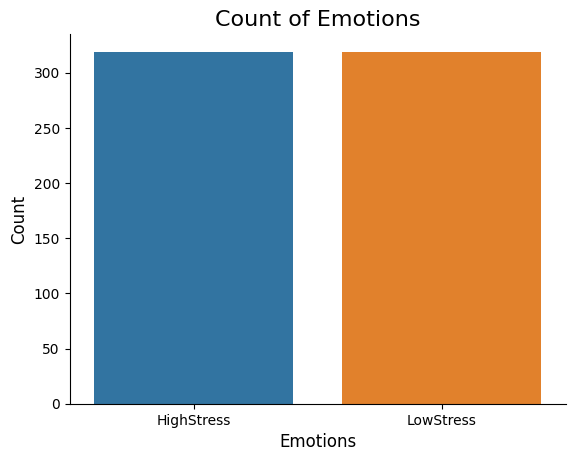

In [16]:
plt.figure(1)
plt.title('Count of Emotions', size=16)
sns.countplot(data=df, x='Emotions')
plt.ylabel('Count', size=12)
plt.xlabel('Emotions', size=12)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.show()

We can also plot waveplots and spectograms for audio signals

* Waveplots - Waveplots let us know the loudness of the audio at a given time.
* Spectograms - A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. It’s a representation of frequencies changing with respect to time for given audio/music signals.

In [9]:
pip install --upgrade librosa

Note: you may need to restart the kernel to use updated packages.


In [17]:
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for audio with {} emotion'.format(e), size=15)
    librosa.display.waveshow(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for audio with {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()

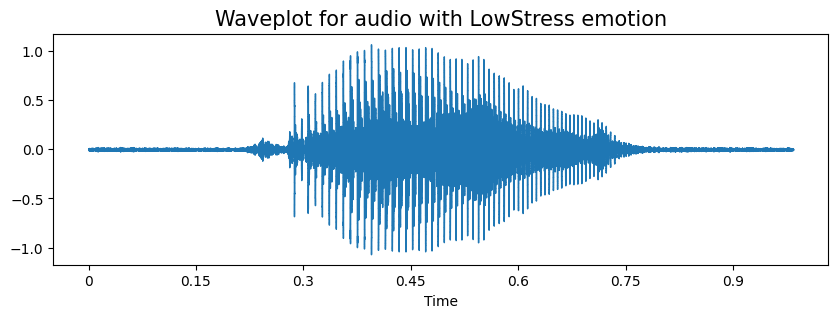

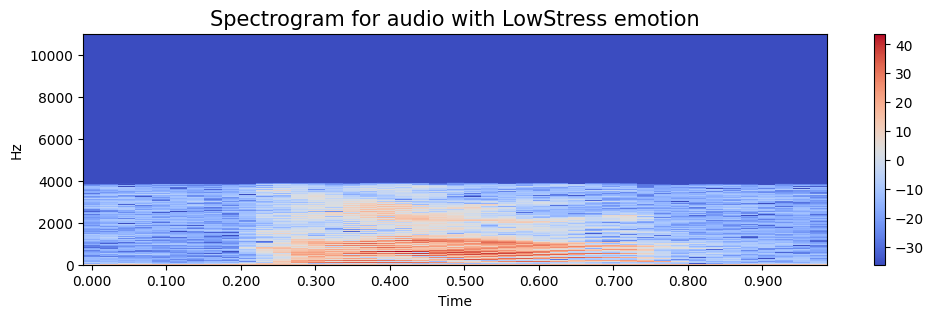

In [162]:
emotion='LowStress'
path = np.array(data_path.Path[data_path.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

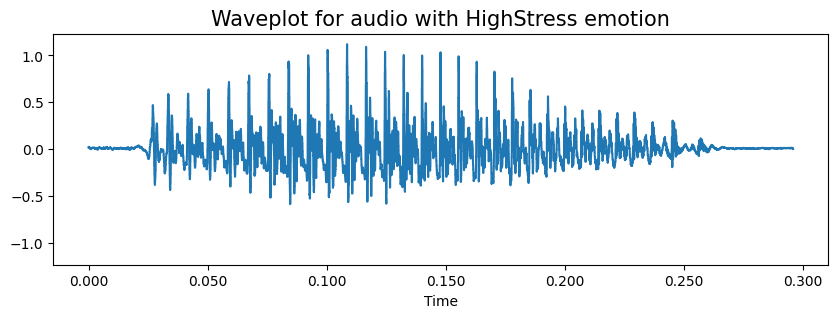

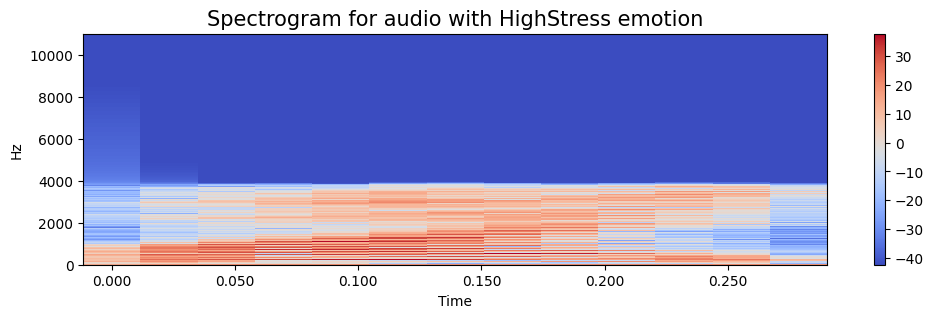

In [163]:
emotion='HighStress'
path = np.array(data_path.Path[data_path.Emotions==emotion])[1]
data, sampling_rate = librosa.load(path)
create_waveplot(data, sampling_rate, emotion)
create_spectrogram(data, sampling_rate, emotion)
Audio(path)

## Data Augmentation

- Data augmentation is the process by which we create new synthetic data samples by adding small perturbations on our initial training set.
- To generate syntactic data for audio, we can apply noise injection, shifting time, changing pitch and speed.
- The objective is to make our model invariant to those perturbations and enhace its ability to generalize.
- In order to this to work adding the perturbations must conserve the same label as the original training sample.
- In images data augmention can be performed by shifting the image, zooming, rotating ...

First, let's check which augmentation techniques works better for our dataset.

In [18]:
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=0.8)

def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

# taking any example and checking for techniques.
path = np.array(data_path.Path)[1]
data, sample_rate = librosa.load(path)

#### 1. Simple Audio

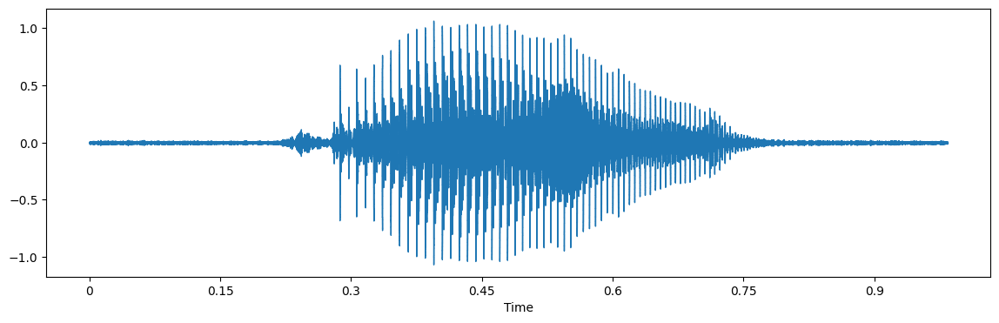

In [166]:
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate)
Audio(path)

#### 2. Noise Injection

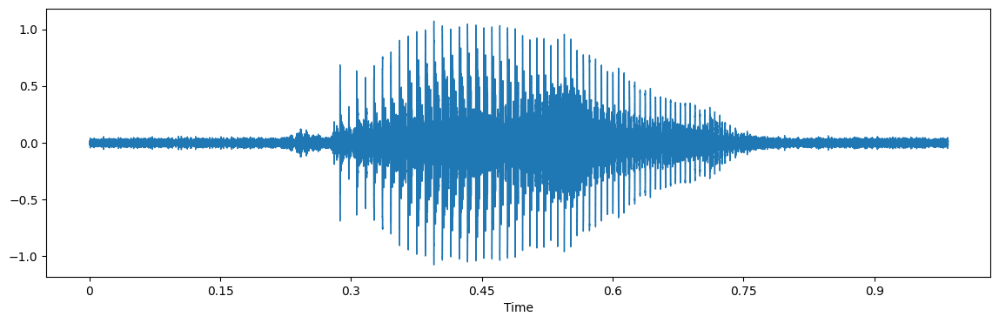

In [167]:
x = noise(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

We can see noise injection is a very good augmentation technique because of which we can assure our training model is not overfitted

#### 3. Stretching

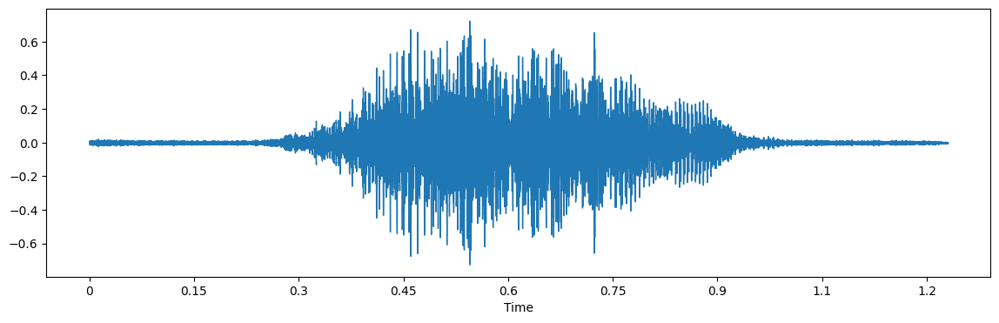

In [168]:
x = stretch(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

#### 4. Shifting

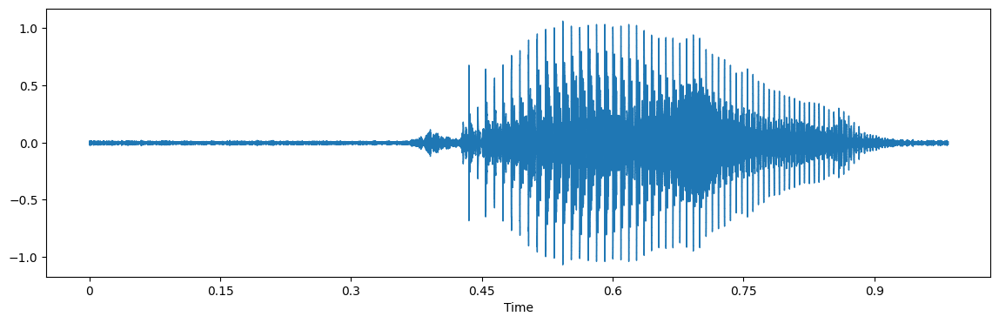

In [169]:
x = shift(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

#### 5. Pitch

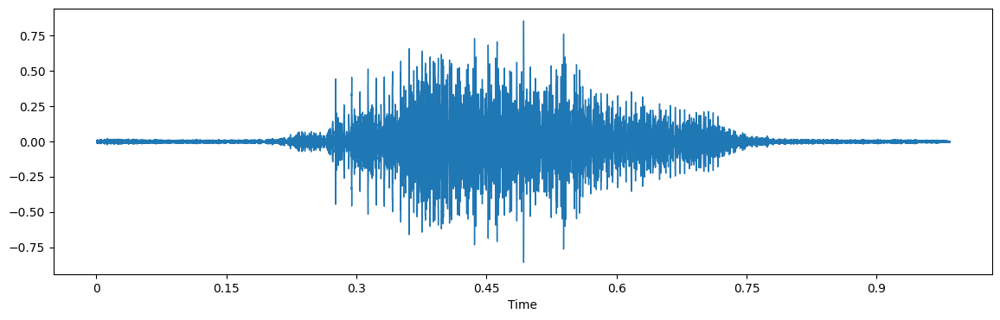

In [170]:
x = pitch(data, sample_rate)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
Audio(x, rate=sample_rate)

- From the above types of augmentation techniques i am using noise, stretching(ie. changing speed) and some pitching.

## Feature Extraction
- Extraction of features is a very important part in analyzing and finding relations between different things. As we already know that the data provided of audio cannot be understood by the models directly so we need to convert them into an understandable format for which feature extraction is used.


In [19]:
rms =librosa.feature.rms(y=data).T
rms.shape


#result = np.hstack((result, rms))

(58, 1)

In [20]:
def rmse(data):
    hop_length = 512
    frame_length = 1024
    n_fft = 1

    rmse = librosa.feature.rmse(x, frame_length=frame_length, hop_length=hop_length, center=True)

    rmse = rmse[0]

    energy = np.array([ sum(abs(x[i:i+frame_length]**2))
    for i in range(0, len(x), hop_length)])
   


In [21]:

def mler(rms):
    lef=0
    delta=0.06
    lowthresh=rms.mean()*delta
    for val in rms:
        lef+=np.sign(lowthresh-val)+1
    mler=lef/len(rms)
    return mler

def extract_features(data):
    # # ZCR
    result = np.array([])
    # zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    # result=np.hstack((result, zcr)) # stacking horizontally

    # #Chroma_stft
    # stft = np.abs(librosa.stft(data))
    # chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    # result = np.hstack((result, chroma_stft)) # stacking horizontally

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mfcc)) # stacking horizontally

    # # Root Mean Square Value
    # rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    # result = np.hstack((result, rms)) # stacking horizontally

    # # MelSpectogram
    # mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    # result = np.hstack((result, mel)) # stacking horizontally
    
    #spectral centroid
    # spec_cent=np.mean(librosa.feature.spectral_centroid(y=data, sr=sample_rate).T, axis=0)
    # result = np.hstack((result, spec_cent)) # stacking horizontally
    
    #spectral contrast
    S = np.abs(librosa.stft(data))
    contrast = np.mean(librosa.feature.spectral_contrast(S=S, sr=sample_rate).T, axis=0)
    result = np.hstack((result, contrast)) # stacking horizontally
    
    # #spectral flux
    # onset_env =np.mean( librosa.onset.onset_strength(sr=sample_rate, S=librosa.amplitude_to_db(data, ref=np.max)))
    # result=np.hstack((result,onset_env))
    
    # #mler
    # Mler=mler(rms)
    # result=np.hstack((result,Mler))
    
    # #chroma_sens
    # chroma_cens = np.mean(librosa.feature.chroma_cens(y=data, sr=sample_rate))
    # result=np.hstack((result,chroma_cens))
    
    
    #entropy
    
   # ee=np.round(ent.spectral_entropy(data, sf=100, method='fft'), 2)
    #result=np.np.hstack((result,ee))
    #rmse
    #Rmse=rmse(data)
   # result=np.hstack((result,rmse))
    #spectral roll off
    # spec_rolloff = np.mean(librosa.feature.spectral_rolloff(x, sr=sample_rate)[0])
    # result=np.hstack((result,spec_rolloff))
    
    
    
    
    
    
    
    
    
    
    
    return result

def get_features(path):
    # duration and offset are used to take care of the no audio in start and the ending of each audio files as seen above.
    data, sample_rate = librosa.load(path, duration=2.5, offset=0.6)
    
    # without augmentation
    res1 = extract_features(data)
    result = np.array(res1)
    
    # data with noise
    noise_data = noise(data)
    res2 = extract_features(noise_data)
    result = np.vstack((result, res2)) # stacking vertically
    
    # data with stretching and pitching
    new_data = stretch(data)
    data_stretch_pitch = pitch(new_data, sample_rate)
    res3 = extract_features(data_stretch_pitch)
    result = np.vstack((result, res3)) # stacking vertically
    
    return result

In [22]:
X, Y = [], []
for path, emotion in zip(data_path.Path, data_path.Emotions):
    print('x', X)
    print('y', Y)
    feature = get_features(path)
    for ele in feature:
        X.append(ele)
        # appending emotion 3 times as we have made 3 augmentation techniques on each audio file.
        Y.append(emotion)

print('selesai')

x []
y []
x [array([-4.08165894e+02,  1.92454178e+02, -3.43381996e+01,  4.84709587e+01,
        5.17231789e+01, -1.82325191e+01,  1.76175137e+01,  1.75826168e+01,
       -7.95630121e+00,  1.47745590e+01,  3.01594794e-01, -8.52079487e+00,
        1.50728779e+01, -7.65201211e-01, -5.14514065e+00,  1.22326078e+01,
       -3.41900682e+00, -3.34288311e+00,  8.53119183e+00, -6.65588236e+00,
        1.53593828e+01,  1.13253052e+01,  1.35678844e+01,  1.28001516e+01,
        1.51435528e+01,  6.13336813e+01,  9.98303612e+00]), array([-198.58730051,   33.03774877,   18.47169939,   23.32853705,
         21.11348101,    7.74460819,    5.5635429 ,    8.84650715,
          6.98208084,    3.73354229,    1.46447916,    2.42570767,
          3.37994256,    0.33410802,    1.67111345,    3.17411955,
          0.78011002,   -0.21978892,    0.25220497,   -0.2243367 ,
         15.2157519 ,   10.56697968,   11.98562002,   12.19598827,
         13.55574959,   13.98791238,   13.47435498]), array([-4.79908569e+0

ValueError: zero-size array to reduction operation maximum which has no identity

In [23]:
len(X), len(Y), data_path.Path.shape
print('tt')

tt


In [24]:
Features = pd.DataFrame(X)
Features['labels'] = Y
Features.to_csv('features.csv', index=False)
Features.head()


,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,labels
0,-408.165894,192.454178,-34.338200,48.470959,51.723179,-18.232519,17.617514,17.582617,-7.956301,14.774559,...,8.531192,-6.655882,15.359383,11.325305,13.567884,12.800152,15.143553,61.333681,9.983036,HighStress
1,-198.587301,33.037749,18.471699,23.328537,21.113481,7.744608,5.563543,8.846507,6.982081,3.733542,...,0.252205,-0.224337,15.215752,10.566980,11.985620,12.195988,13.555750,13.987912,13.474355,HighStress
2,-479.908569,185.170135,-35.671894,55.966064,46.851231,-20.036840,23.686037,15.181668,-7.288748,17.365461,...,7.006847,-7.329497,18.523499,11.595396,15.597247,14.510365,17.164064,58.157822,11.942699,HighStress
3,-442.493256,182.201035,-23.704500,44.882446,47.435074,-9.938423,20.437471,15.778339,-6.748260,18.329119,...,7.524123,-3.649074,17.061703,11.396157,13.351679,12.396030,14.492808,58.947865,8.482357,HighStress
4,-328.111746,65.173003,31.391149,32.417838,28.462160,12.959182,10.106426,8.872564,7.563082,8.709482,...,1.436351,0.005007,17.389495,11.579640,13.381817,12.771287,13.878257,14.226734,13.602205,HighStress


* We have applied data augmentation and extracted the features for each audio files and saved them.

## Data Preparation

- As of now we have extracted the data, now we need to normalize and split our data for training and testing.

In [25]:
X = Features.iloc[: ,:-1].values
Y = Features['labels'].values

In [26]:
# As this is a multiclass classification problem onehotencoding our Y.
encoder = OneHotEncoder()
Y = encoder.fit_transform(np.array(Y).reshape(-1,1)).toarray()

In [27]:
# splitting data
x_train, x_test, y_train, y_test = train_test_split(X, Y, random_state=0, shuffle=True)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((252, 27), (252, 1), (84, 27), (84, 1))

In [28]:
# scaling our data with sklearn's Standard scaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((252, 27), (252, 1), (84, 27), (84, 1))

In [29]:
# making our data compatible to model.
x_train = np.expand_dims(x_train, axis=2)
x_test = np.expand_dims(x_test, axis=2)
x_train.shape, y_train.shape, x_test.shape, y_test.shape

((252, 27, 1), (252, 1), (84, 27, 1), (84, 1))

## Modelling

Model 1 : 1D CNN(256,3 layer)

In [32]:
model1= Sequential()
model1.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu', input_shape=(x_train.shape[1], 1)))
model1.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model1.add(Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu'))
model1.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model1.add(Conv1D(128, kernel_size=5, strides=1, padding='same', activation='relu'))
model1.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))
model1.add(Dropout(0.2))

model1.add(Conv1D(64, kernel_size=5, strides=1, padding='same', activation='relu'))
model1.add(MaxPooling1D(pool_size=5, strides = 2, padding = 'same'))

model1.add(Flatten())
model1.add(Dense(units=64, activation='relu'))
model1.add(Dropout(0.2))

model1.add(Dense(units=32, activation='relu'))
model1.add(Dropout(0.3))

model1.add(Dense(units=2, activation='softmax'))
model1.compile(optimizer = 'adam' , loss = 'sparse_categorical_crossentropy' , metrics = ['accuracy'])

model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 27, 256)           1536      
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 14, 256)          0         
 1D)                                                             
                                                                 
 conv1d_5 (Conv1D)           (None, 14, 256)           327936    
                                                                 
 max_pooling1d_5 (MaxPooling  (None, 7, 256)           0         
 1D)                                                             
                                                                 
 conv1d_6 (Conv1D)           (None, 7, 128)            163968    
                                                                 
 max_pooling1d_6 (MaxPooling  (None, 4, 128)          

In [33]:
rlrp = ReduceLROnPlateau(monitor='loss', factor=0.4, verbose=0, patience=2, min_lr=0.0001)
history=model1.fit(x_train, y_train, batch_size=64, epochs=100, validation_data=(x_test, y_test), callbacks=[rlrp])

Epoch 1/100


4/4 [==============================] - 2s 108ms/step - loss: 0.3718 - accuracy: 0.8254 - val_loss: 0.0025 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 2/100
4/4 [==============================] - 0s 37ms/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 7.0958e-09 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 3/100
4/4 [==============================] - 0s 40ms/step - loss: 2.0579e-05 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 4/100
4/4 [==============================] - 0s 40ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 5/100
4/4 [==============================] - 0s 37ms/step - loss: 2.3180e-08 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000 - lr: 0.0010
Epoch 6/100
4/4 [==============================] - 0s 38ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000 - lr: 4.0000e-04
Epoch 7/100
4/4 [==============================] - 0s

In [35]:
model2 = Sequential()
model2.add(Conv1D(32, 3, activation="relu", padding="same", input_shape=( x_train.shape[1],1)))
model2.add(MaxPooling1D(2))
model2.add(Dropout(0.2))
model2.add(Flatten())
model2.add(Dense(128, activation="relu"))
model2.add(Dropout(0.2))
model2.add(Dense(2, activation="softmax"))

# Compile the model
model2.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

# Train the model
model2.fit(x_train, y_train, epochs=100,validation_data=(x_test, y_test))

Epoch 1/100
8/8 [==============================] - 1s 23ms/step - loss: 0.1434 - accuracy: 0.9921 - val_loss: 0.0099 - val_accuracy: 1.0000
Epoch 2/100
8/8 [==============================] - 0s 9ms/step - loss: 0.0037 - accuracy: 1.0000 - val_loss: 8.1111e-04 - val_accuracy: 1.0000
Epoch 3/100
8/8 [==============================] - 0s 7ms/step - loss: 4.8820e-04 - accuracy: 1.0000 - val_loss: 2.0849e-04 - val_accuracy: 1.0000
Epoch 4/100
8/8 [==============================] - 0s 10ms/step - loss: 1.5703e-04 - accuracy: 1.0000 - val_loss: 1.0205e-04 - val_accuracy: 1.0000
Epoch 5/100
8/8 [==============================] - 0s 7ms/step - loss: 8.6604e-05 - accuracy: 1.0000 - val_loss: 7.0476e-05 - val_accuracy: 1.0000
Epoch 6/100
8/8 [==============================] - 0s 8ms/step - loss: 8.2401e-05 - accuracy: 1.0000 - val_loss: 5.7810e-05 - val_accuracy: 1.0000
Epoch 7/100
8/8 [==============================] - 0s 7ms/step - loss: 5.3321e-05 - accuracy: 1.0000 - val_loss: 5.1671e-05 - va

3/3 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - accuracy: 1.0000


Accuracy of our model on test data :  100.0 %


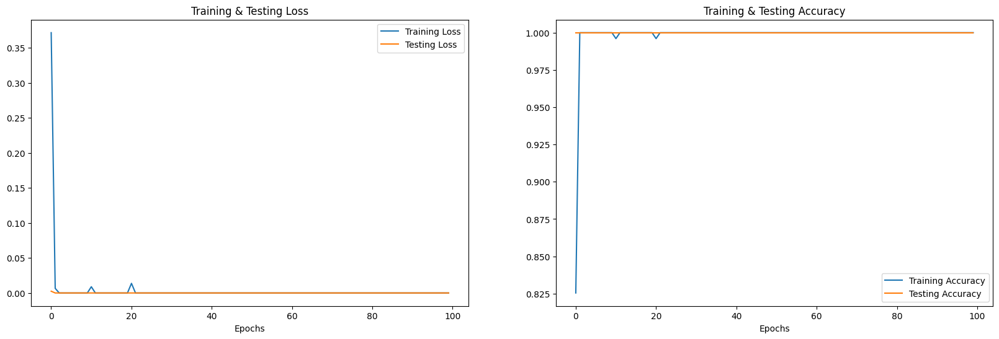

In [36]:
print("Accuracy of our model on test data : " , model1.evaluate(x_test,y_test)[1]*100 , "%")

epochs = [i for i in range(100)]
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
test_acc = history.history['val_accuracy']
test_loss = history.history['val_loss']

fig.set_size_inches(20,6)
ax[0].plot(epochs , train_loss , label = 'Training Loss')
ax[0].plot(epochs , test_loss , label = 'Testing Loss')
ax[0].set_title('Training & Testing Loss')
ax[0].legend()
ax[0].set_xlabel("Epochs")

ax[1].plot(epochs , train_acc , label = 'Training Accuracy')
ax[1].plot(epochs , test_acc , label = 'Testing Accuracy')
ax[1].set_title('Training & Testing Accuracy')
ax[1].legend()
ax[1].set_xlabel("Epochs")
plt.show()

In [37]:
def preprocess_wav_file(file_path):
    # Load the WAV file and extract features (you may need to customize this part)
    y, sr = librosa.load(file_path, sr=None)  # Load the WAV file
    # Extract features (e.g., MFCCs, chroma, etc.) and format the data
    # Ensure that the data shape matches the input shape of your model
    # Example feature extraction:
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)  # Replace with your feature extraction
    # Ensure the data shape matches your model's input shape (e.g., (num_samples, num_features))
    # You may need to reshape or pad the data if necessary

    return mfccs

# Replace 'your_new_wav_file.wav' with the path to your new WAV file
new_wav_file_path = 'output.wav'

# Preprocess the new WAV file
new_data = get_features(new_wav_file_path)

In [73]:
from sklearn.preprocessing import LabelEncoder
# predicting on test data.
label_encoder = LabelEncoder()

# Create a LabelEncoder instance and fit it with your class labels
class_labels = ["LowStress", "HighStress"]
label_encoder.fit(class_labels)

# Predict on new data and get predicted labels
print(new_data)
pred_test = model1.predict(new_data)
predicted_classes = np.argmax(pred_test, axis=1)

# Inverse transform the predicted classes to get predicted labels as strings
y_pred = label_encoder.inverse_transform(predicted_classes)
y_pred = y_pred.reshape(-1, 1)

# Assuming you have a list of actual labels for your test data, let's call it actual_labels
# Encode the actual labels using the label_encoder
actual_encoded_labels = label_encoder.transform(y_pred)

y_test = label_encoder.inverse_transform(actual_encoded_labels)

[[-3.79721436e+02  1.28067017e+02 -9.79638481e+00  4.05744123e+00
   6.32501125e+00  1.91205907e+00 -1.21560564e+01 -1.05805016e+01
  -5.41424847e+00  6.43097782e+00  2.90089083e+00 -1.48611987e+00
  -4.73253632e+00  1.96326590e+00 -5.11742055e-01  1.05092049e+00
  -7.03284502e+00  4.58487177e+00 -5.03050756e+00 -1.63036215e+00
   1.59834046e+01  1.38625826e+01  1.71937115e+01  1.54848433e+01
   1.90547724e+01  1.68484433e+01  4.45206562e+01]
 [-2.44765703e+02  4.06954427e+01  1.04873645e+01 -6.37422118e-01
   4.79683655e-01 -2.48501026e+00 -7.70705986e+00 -9.24117459e+00
  -5.08855739e+00 -2.48115989e-01  9.33536159e-01 -1.13113593e+00
  -2.66247062e+00 -1.43895221e+00 -2.84270821e-01 -1.58118923e+00
  -3.06513792e+00 -1.40418747e+00 -1.75731520e+00 -1.93681731e+00
   1.42745414e+01  1.35880556e+01  1.58308013e+01  1.42726586e+01
   1.50683789e+01  1.36552881e+01  1.35974619e+01]
 [-4.47519379e+02  1.25965233e+02 -1.16373596e+01  3.53362536e+00
   4.13298655e+00 -7.40557849e-01 -1.519

In [74]:
df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df['Predicted Labels'] = y_pred.flatten()
df['Actual Labels'] = y_test.flatten()

df.head(10)

,Predicted Labels,Actual Labels
0,LowStress,LowStress
1,LowStress,LowStress
2,LowStress,LowStress


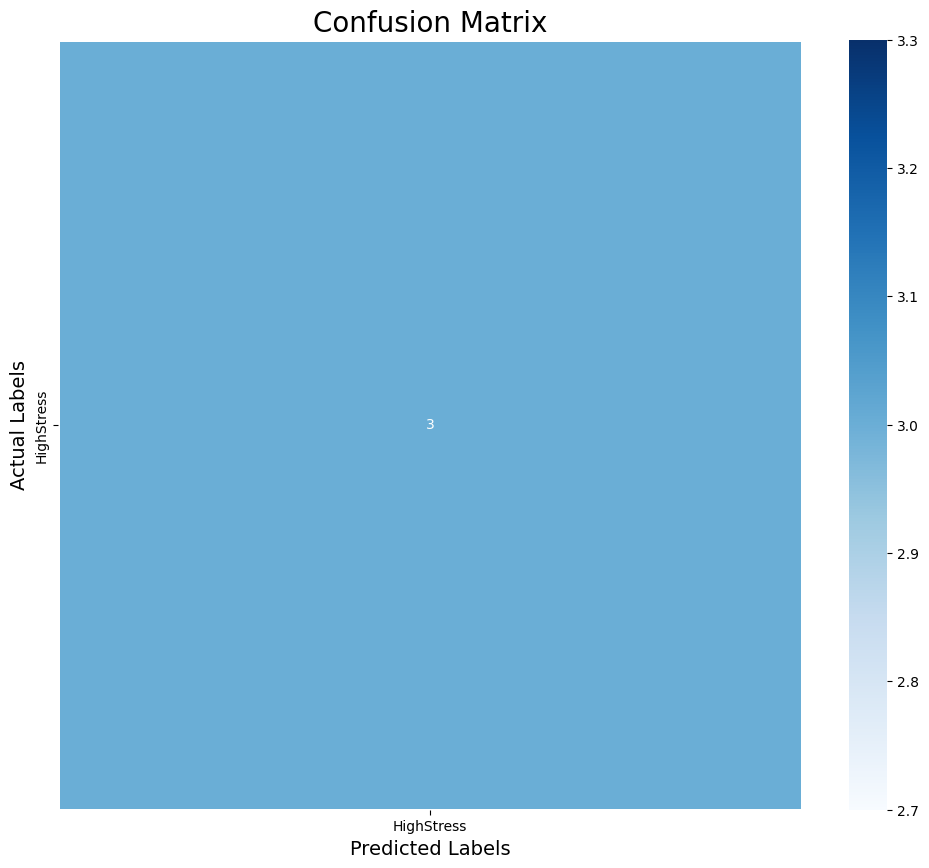

In [75]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize = (12, 10))
cm = pd.DataFrame(cm , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
sns.heatmap(cm, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='')
plt.title('Confusion Matrix', size=20)
plt.xlabel('Predicted Labels', size=14)
plt.ylabel('Actual Labels', size=14)
plt.show()

In [76]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

   LowStress       1.00      1.00      1.00         3

    accuracy                           1.00         3
   macro avg       1.00      1.00      1.00         3
weighted avg       1.00      1.00      1.00         3



- We can see our model is more accurate in predicting surprise, angry emotions and it makes sense also because audio files of these emotions differ to other audio files in a lot of ways like pitch, speed etc..
- We overall achieved 79% accuracy on our test data and its decent but we can improve it more by applying more augmentation techniques and using other feature extraction methods.